In [ ]:
from google.colab import drive
drive.mount('/content/drive',force_remount=True)

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [ ]:
import os
import glob
import random
import gc
import pickle
import time
import tensorflow
import datetime
import math
import time

os.environ['KERAS_BACKEND'] = 'tensorflow'
#os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3' # 3 = INFO, WARNING, and ERROR messages are not printed

from tqdm import tqdm

import numpy as np
import pandas as pd
from IPython.display import FileLink
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns 
%matplotlib inline
from IPython.display import display, Image
import matplotlib.image as mpimg
import cv2
import PIL
from PIL import Image

from sklearn.model_selection import train_test_split
from sklearn.datasets import load_files       
from keras.utils import np_utils
from sklearn.utils import shuffle
from sklearn.metrics import log_loss

from keras.models import Sequential, Model
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization, GlobalAveragePooling2D
from keras.preprocessing.image import ImageDataGenerator
from keras.preprocessing import image
from keras.callbacks import ModelCheckpoint, EarlyStopping
from keras.applications.vgg16 import VGG16
from keras.applications.vgg19 import VGG19


from keras.utils import to_categorical
from keras.models import Model
from keras import optimizers

from keras.layers import Dense,GlobalAveragePooling2D
from keras.applications import MobileNet
from keras.applications.mobilenet import preprocess_input

from sklearn.metrics import log_loss
from tensorflow.keras.losses import CategoricalCrossentropy
from sklearn.metrics import classification_report
from keras.callbacks import LearningRateScheduler

Using TensorFlow backend.


In [ ]:
dataset = pd.read_csv('/content/drive/My Drive/kaggle/state-farm-detection/driver_imgs_list.csv')
dataset.head(5)

,subject,classname,img
0,p002,c0,img_44733.jpg
1,p002,c0,img_72999.jpg
2,p002,c0,img_25094.jpg
3,p002,c0,img_69092.jpg
4,p002,c0,img_92629.jpg


In [ ]:
img_rows = 224
img_cols = 224
color_type = 3
activity_map = {'c0': 'Safe driving', 
                'c1': 'Texting - right', 
                'c2': 'Talking on the phone - right', 
                'c3': 'Texting - left', 
                'c4': 'Talking on the phone - left', 
                'c5': 'Operating the radio', 
                'c6': 'Drinking', 
                'c7': 'Reaching behind', 
                'c8': 'Hair and makeup', 
                'c9': 'Talking to passenger'}

**Reading images from drive**

In [ ]:
%%time

driver_details = pd.read_csv('/content/drive/My Drive/kaggle/state-farm-detection/driver_imgs_list.csv',na_values='na')

train_image = []
image_label = []


for i in range(10):
    print('now we are in the folder C',i)
    imgs = os.listdir("/content/drive/My Drive/kaggle/state-farm-detection/imgs/train/c"+str(i))
    print(len(imgs))
    for j in range(len(imgs)):               ########comment range(len(imgs)):#1300
    #for j in range(100):
        
        img_name = "/content/drive/My Drive/kaggle/state-farm-detection/imgs/train/c"+str(i)+"/"+imgs[j]
        img = cv2.imread(img_name)
        
        #img = Image.open(img_name)
        #wpercent = (img_rows/float(img.size[0]))
        #hsize = int((float(img.size[1])*float(wpercent)))
        #img = img.resize((img_rows,hsize), PIL.Image.ANTIALIAS)
        #img=np.array(img)
        #img=img/255
        
        #img = color.rgb2gray(img)
        #img = img[50:,120:-50]           ########uncomment to crop
        
        img = cv2.resize(img,(img_rows,img_cols))
        label = i
        driver = driver_details[driver_details['img'] == imgs[j]]['subject'].values[0]
        train_image.append([img,label,driver])
        image_label.append(i)
if not os.path.exists('cache'):        
        os.mkdir('cache')
        
file = open('/content/drive/My Drive/kaggle/state-farm-detection/cacheTrain/train224.dat', 'wb')
pickle.dump(train_image, file)
file.close()


now we are in the folder C 0
2489
now we are in the folder C 1
2267
now we are in the folder C 2
2317
now we are in the folder C 3
2346
now we are in the folder C 4
2326
now we are in the folder C 5
2312
now we are in the folder C 6
2325
now we are in the folder C 7
2002
now we are in the folder C 8
1911
now we are in the folder C 9
2129
CPU times: user 3min 13s, sys: 34 s, total: 3min 47s
Wall time: 1h 34min 27s


In [ ]:
%%time
train_image = []
file = open('/content/drive/My Drive/kaggle/state-farm-detection/cacheTrain/train224.dat', 'rb')
train_image=pickle.load(file)
file.close()

CPU times: user 953 ms, sys: 3.13 s, total: 4.08 s
Wall time: 52.5 s


In [ ]:
len(train_image)

22424

In [ ]:
i = 0
fig, ax = plt.subplots(1, 2, figsize = (img_rows,img_cols ))
for i in range(2):
    #print ('Image number:',i)
    img = train_image[i][0]
    #img = color.rgb2gray(img)
    #\img = img[50:,120:-50]
    #img = cv2.resize(img,(img_rows,img_cols))
    
    ax[i].imshow(img)
    plt.show


In [ ]:
driv_selected =  ['p061', 'p035', 'p056', 'p052'] # ['p061', 'p035', 'p056', 'p052'] ['p050', 'p015', 'p022', 'p056','p042']
### NEW RANDOM SEARCH ['p014', 'p012', 'p064', 'p039'] 2.27 start

X_train= []
y_train = []
X_test = []
y_test = []
D_train = []
D_test = []
true_test = []

for features,labels,drivers in train_image:
    if drivers in driv_selected:
        X_test.append(features)
        y_test.append(labels)
        D_test.append(drivers)
        true_test.append(labels)
    
    else:
        X_train.append(features)
        y_train.append(labels)
        D_train.append(drivers)
    
print (len(X_train),len(X_test))
print (len(y_train),len(y_test))

19233 3191
19233 3191


In [ ]:
del D_test,D_train,true_test

In [ ]:
X_train = np.array(X_train)
X_test = np.array(X_test)

y_train = to_categorical(y_train)
y_test = to_categorical(y_test)
img_rows=X_train.shape[1]
img_cols=X_train.shape[2]
print(img_rows,img_cols)

print (X_train.shape)
print(y_train.shape)

224 224
(19233, 224, 224, 3)
(19233, 10)


In [ ]:
gc.collect()

344

In [ ]:
batch_size = 4 #648
nb_epoch =40

# **Transfer Learning (ResNet)**

In [ ]:
from keras.layers import Input
resnet50_input = Input(shape = (224, 224, 3), name = 'Image_input')

## The RESNET model

from keras.applications.resnet50 import preprocess_input, decode_predictions
from keras.applications.resnet50 import ResNet50


#Get the RESNET weights and layers

model_resnet50_conv = ResNet50(weights= 'imagenet', include_top=False, input_shape= (224,224,3))

94658560/94653016 [==============================] - 2s 0us/step


In [ ]:
from keras.models import Model


x=model_resnet50_conv.output
x=GlobalAveragePooling2D()(x)

x = Dropout(0.001)(x)

x=Dense(512,activation='relu')(x)

preds=Dense(10,activation='softmax')(x) #final layer with softmax activation

resnet50_pretrained = Model(inputs=model_resnet50_conv.input, outputs=preds)
    
#output_resnet50_conv = model_resnet50_conv(resnet50_input)
#Add the fully-connected layers 
#x=GlobalAveragePooling2D()(output_resnet50_conv)
#x = Flatten(name='flatten')(output_resnet50_conv)
#x = Dense(500, activation='relu', name='fc1')(x)
#x = Dense(500, activation='relu', name='fc2')(x)
#x = Dense(10, activation='softmax', name='predictions')(x)


#resnet50_pretrained = Model(input = resnet50_input, output = x)

resnet50_pretrained.summary()

# Compile CNN model
#adam = keras.optimizers.Adam(lr=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-8, decay=0.0)

def custom_loss(y_true, y_pred):
    return tf.keras.losses.CategoricalCrossentropy(y_true, y_pred, label_smoothing=0.1)

def step_decay(epoch):
    initial_lrate = 0.001
    drop = 0.5
    epochs_drop = 10.0
    lrate = initial_lrate * math.pow(drop,  
        math.floor((1+epoch)/epochs_drop))
    return lrate

lrate = LearningRateScheduler(step_decay)

sgd = optimizers.SGD( lr=5e-4, momentum=0.9)#0.001)
cc=CategoricalCrossentropy(label_smoothing=5e-5)

resnet50_pretrained.compile(loss=cc,optimizer = sgd,metrics=['accuracy'])

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 224, 224, 3)  0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_conv1 (BatchNormalization)   (None, 112, 112, 64) 256         conv1[0][0]                      
____________________________________________________________________________________________

In [ ]:
%%time
from keras.callbacks import ModelCheckpoint,EarlyStopping

checkpointer = ModelCheckpoint('/content/drive/My Drive/kaggle/state-farm-detection/MODELS/resnet_weights_aug_alltrained_sgd2_setval2.hdf5', verbose=1, save_best_only=True)
earlystopper = EarlyStopping(monitor='val_loss', patience=15, verbose=1)


datagen = ImageDataGenerator(
    height_shift_range=0.5,
    width_shift_range = 0.5,
    zoom_range = 0.5,
    rotation_range=30
        )
#datagen_valid =ImageDataGenerator(rescale=1./255)
#datagen.fit(X_train)
data_generator = datagen.flow(X_train, y_train, batch_size = batch_size)
#data_generator_valid= datagen_valid.flow(x=X_test,y= y_test)

# Fits the model on batches with real-time data augmentation:
resnet50_model = resnet50_pretrained.fit_generator(data_generator,steps_per_epoch = len(X_train) / batch_size, callbacks=[checkpointer, earlystopper],
                                                            epochs = nb_epoch, verbose = 1, validation_data = (X_test,y_test))

Epoch 1/40
4809/4808 [==============================] - 429s 89ms/step - loss: 1.0012 - accuracy: 0.6548 - val_loss: 0.2758 - val_accuracy: 0.9248

Epoch 00001: val_loss improved from inf to 0.27582, saving model to /content/drive/My Drive/kaggle/state-farm-detection/MODELS/resnet_weights_aug_alltrained_sgd2_setval2.hdf5
Epoch 2/40
4809/4808 [==============================] - 411s 86ms/step - loss: 0.5624 - accuracy: 0.8060 - val_loss: 0.2684 - val_accuracy: 0.9254

Epoch 00002: val_loss improved from 0.27582 to 0.26840, saving model to /content/drive/My Drive/kaggle/state-farm-detection/MODELS/resnet_weights_aug_alltrained_sgd2_setval2.hdf5
Epoch 3/40
4809/4808 [==============================] - 413s 86ms/step - loss: 0.4627 - accuracy: 0.8408 - val_loss: 0.3015 - val_accuracy: 0.9079

Epoch 00003: val_loss did not improve from 0.26840
Epoch 4/40
4809/4808 [==============================] - 415s 86ms/step - loss: 0.3964 - accuracy: 0.8622 - val_loss: 0.4090 - val_accuracy: 0.8840

Epo

In [ ]:
model=resnet50_pretrained.load_weights('/content/drive/My Drive/kaggle/state-farm-detection/MODELS/resnet_weights_aug_alltrained_sgd2_setval2.hdf5')

In [ ]:
activity_map = {'c0': 'Safe driving', 
                'c1': 'Texting - right', 
                'c2': 'Talking on the phone - right', 
                'c3': 'Texting - left', 
                'c4': 'Talking on the phone - left', 
                'c5': 'Operating the radio', 
                'c6': 'Drinking', 
                'c7': 'Reaching behind', 
                'c8': 'Hair and makeup', 
                'c9': 'Talking to passenger'}

In [ ]:
%%time
predictions_valid = resnet50_pretrained.predict(X_test)
#predictions_valid=predict
score = log_loss(y_test, predictions_valid)
print('Score log_loss: ', score)
val_pred=np.argmax(predictions_valid,axis=1)
val=np.argmax(y_test,axis=1)
print(classification_report(val, val_pred,target_names=activity_map))

Score log_loss:  0.19957686379194473
              precision    recall  f1-score   support

          c0       0.95      0.85      0.89       331
          c1       0.99      1.00      1.00       313
          c2       0.99      0.99      0.99       333
          c3       1.00      0.99      0.99       325
          c4       0.98      1.00      0.99       322
          c5       0.89      1.00      0.94       323
          c6       0.99      0.96      0.98       331
          c7       0.88      1.00      0.93       311
          c8       0.94      0.88      0.91       291
          c9       0.89      0.83      0.86       311

    accuracy                           0.95      3191
   macro avg       0.95      0.95      0.95      3191
weighted avg       0.95      0.95      0.95      3191

CPU times: user 19min 55s, sys: 31.7 s, total: 20min 26s
Wall time: 10min 28s


In [ ]:
del predictions_valid ,val_pred,val

NameError: ignored

# **Transfer Learning (Mobile Net)**

In [ ]:
gc.enable()
gc.collect()

13

In [ ]:
def modelMobileNet_Without_extra():
    import keras

    base_model=MobileNet(weights='imagenet',include_top=False) #imports the mobilenet model and discards the last 1000 neuron layer.

    x=base_model.output
    x=GlobalAveragePooling2D()(x)

    #x = Dropout(0.01)(x)

    #x=Dense(512,activation='relu')(x)

    preds=Dense(10,activation='softmax')(x) #final layer with softmax activation

    model = Model(inputs=base_model.input, outputs=preds)
    
    from keras import optimizers  

    #adam = optimizers.Adam(lr=0.001) #tried 0.0005 - too slow and didn't converge
    #adam = keras.optimizers.Adam(lr=5e-4, beta_1=0.9, beta_2=0.999, epsilon=1e-8, decay=0.0)
    sgd = optimizers.SGD(lr=5e-4, momentum=0.9) # try 0.01 - didn't converge and 0.005 , 0.001 best acc of 11%
    cc=CategoricalCrossentropy(label_smoothing=5e-5) #'categorical_crossentropy'
    #RMSprop= keras.optimizers.RMSprop(lr=5e-4)
    
    
    model.compile(optimizer=sgd,loss=cc,metrics=['accuracy']) # create object
    
    return model

In [ ]:
model=modelMobileNet_Without_extra()
model.summary()

17227776/17225924 [==============================] - 1s 0us/step
Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, None, None, 3)     0         
_________________________________________________________________
conv1_pad (ZeroPadding2D)    (None, None, None, 3)     0         
_________________________________________________________________
conv1 (Conv2D)               (None, None, None, 32)    864       
_________________________________________________________________
conv1_bn (BatchNormalization (None, None, None, 32)    128       
_________________________________________________________________
conv1_relu (ReLU)            (None, None, None, 32)    0         
_________________________________________________________________
conv_dw_1 (DepthwiseConv2D)  (None, None, None, 32)    288       
____________________________________________________________

In [ ]:
%%time
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint,EarlyStopping

#model=modelMobileNet()

checkpointer = ModelCheckpoint('/content/drive/My Drive/kaggle/state-farm-detection/MODELS/mobilenet_sgd_extra_layers2.hdf5', verbose=1, save_best_only=True)
earlystopper = EarlyStopping(monitor='val_loss', patience=15, verbose=1)

datagen = ImageDataGenerator(
    height_shift_range=0.5,
    width_shift_range = 0.5,
    zoom_range = 0.5,
    rotation_range=30
    #shear_range=0.2
        )
#datagen_valid = ImageDataGenerator(   rescale=1./255   )
#datagen.fit(X_train)
data_generator = datagen.flow(X_train, y_train, batch_size = batch_size)

#data_generator_valid = datagen_valid.flow(x=X_test,y= y_test, batch_size = batch_size)

# Fits the model on batches with real-time data augmentation:
mobilenet_model = model.fit_generator(data_generator,steps_per_epoch = len(X_train) / batch_size, callbacks=[checkpointer, earlystopper],
                                                            epochs = nb_epoch, verbose = 1, validation_data = (X_test,y_test))

Epoch 1/40
4809/4808 [==============================] - 297s 62ms/step - loss: 1.2220 - accuracy: 0.5918 - val_loss: 0.3671 - val_accuracy: 0.9176

Epoch 00001: val_loss improved from inf to 0.36707, saving model to /content/drive/My Drive/kaggle/state-farm-detection/MODELS/mobilenet_sgd_extra_layers1.hdf5
Epoch 2/40
4809/4808 [==============================] - 282s 59ms/step - loss: 0.6783 - accuracy: 0.7759 - val_loss: 0.2627 - val_accuracy: 0.9217

Epoch 00002: val_loss improved from 0.36707 to 0.26272, saving model to /content/drive/My Drive/kaggle/state-farm-detection/MODELS/mobilenet_sgd_extra_layers1.hdf5
Epoch 3/40
4809/4808 [==============================] - 282s 59ms/step - loss: 0.5427 - accuracy: 0.8169 - val_loss: 0.2938 - val_accuracy: 0.9091

Epoch 00003: val_loss did not improve from 0.26272
Epoch 4/40
4809/4808 [==============================] - 282s 59ms/step - loss: 0.4771 - accuracy: 0.8410 - val_loss: 0.2486 - val_accuracy: 0.9179

Epoch 00004: val_loss improved fr

In [ ]:
activity_map = {'c0': 'Safe driving', 
                'c1': 'Texting - right', 
                'c2': 'Talking on the phone - right', 
                'c3': 'Texting - left', 
                'c4': 'Talking on the phone - left', 
                'c5': 'Operating the radio', 
                'c6': 'Drinking', 
                'c7': 'Reaching behind', 
                'c8': 'Hair and makeup', 
                'c9': 'Talking to passenger'}



In [ ]:
%%time
model.load_weights('/content/drive/My Drive/kaggle/state-farm-detection/MODELS/mobilenet_sgd_extra_layers1.hdf5')
predictions_valid = model.predict(X_test)
#predictions_valid=predict
score = log_loss(y_test, predictions_valid)
print('Score log_loss: ', score)
val_pred=np.argmax(predictions_valid,axis=1)
val=np.argmax(y_test,axis=1)
print(classification_report(val, val_pred,target_names=activity_map))

Score log_loss:  0.16420997299681975
              precision    recall  f1-score   support

          c0       0.87      0.80      0.83       331
          c1       0.98      1.00      0.99       313
          c2       1.00      0.98      0.99       333
          c3       1.00      0.98      0.99       325
          c4       0.98      1.00      0.99       322
          c5       0.94      1.00      0.97       323
          c6       0.98      0.94      0.96       331
          c7       0.96      1.00      0.98       311
          c8       0.92      0.92      0.92       291
          c9       0.81      0.83      0.82       311

    accuracy                           0.95      3191
   macro avg       0.94      0.95      0.94      3191
weighted avg       0.95      0.95      0.95      3191

CPU times: user 4.58 s, sys: 1.52 s, total: 6.11 s
Wall time: 9.53 s


# **VGG19**

In [ ]:
def vgg_std19_model(img_rows, img_cols, color_type=3):
    nb_classes = 10
    # Remove fully connected layer and replace
    # with softmax for classifying 10 classes
    vgg19_model = VGG19(weights="imagenet", include_top=False)

    # Freeze all layers of the pre-trained model
    #for layer in vgg16_model.layers:
     #   layer.trainable = False
        
    x = vgg19_model.output
    x = GlobalAveragePooling2D()(x)
    #x = Dense(1024, activation='relu')(x)
    predictions = Dense(nb_classes, activation = 'softmax')(x)

    model = Model(input = vgg19_model.input, output = predictions)
    
    return model

In [ ]:
# Load the VGG19 network
print("Loading network...")
model_vgg19 = vgg_std19_model(img_rows, img_cols)

model_vgg19.summary()
sgd = optimizers.SGD(lr=5e-4, momentum=0.9)#lr=0.001) # try 0.01 - didn't converge and 0.005 , 0.001 best acc of 11%
#r=1e-4, momentum=0.9 old- lr = 0.005
#rms=optimizers.RMSprop(lr=1e-5)
cc=CategoricalCrossentropy(label_smoothing=5e-5) 
#model_vgg16.compile(loss='categorical_crossentropy', optimizer='rmsprop',   metrics=['accuracy'])
#sgd = optimizers.SGD(lr = 0.005) # try 0.01 - didn't converge and 0.005 , 0.001 best acc of 11%

model_vgg19.compile(optimizer=sgd,loss=cc,metrics=['accuracy'])

Loading network...
80142336/80134624 [==============================] - 3s 0us/step
Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, None, None, 3)     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________

In [ ]:

datagen = ImageDataGenerator(
    height_shift_range=0.5,
    width_shift_range = 0.5,
    zoom_range = 0.5,
    rotation_range=30
        )
#datagen.fit(X_train)
data_generator = datagen.flow(X_train, y_train, batch_size = batch_size)
#mobilenet_model=model.fit(X_train, Y_train, batch_size=32, nb_epoch=25, verbose=1, validation_data=(X_valid, Y_valid))

# Fits the model on batches with real-time data augmentation:
#mobilenet_model = model.fit_generator(data_generator,steps_per_epoch = len(X_train) / 32, callbacks=[checkpointer, earlystopper],
 #                                                         epochs = nb_epoch, verbose = 1, validation_data = (X_valid, Y_valid))


nb_train_samples = X_train.shape[0]
nb_validation_samples = X_test.shape[0]

In [ ]:
# Training the vgg Model
    
checkpoint = ModelCheckpoint('/content/drive/My Drive/kaggle/state-farm-detection/MODELS/weights_best_vgg19.hdf5', monitor='val_loss', verbose=1, save_best_only=True, mode='min')
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)

history_v4 = model_vgg19.fit_generator(data_generator,
                         steps_per_epoch = nb_train_samples // batch_size,
                         epochs = nb_epoch, 
                         callbacks=[es, checkpoint],
                         verbose = 1,
                         validation_data = (X_test, y_test),
                         validation_steps = nb_validation_samples // batch_size)

Epoch 1/40
4808/4808 [==============================] - 270s 56ms/step - loss: 2.3045 - accuracy: 0.1111 - val_loss: 2.3029 - val_accuracy: 0.1037

Epoch 00001: val_loss improved from inf to 2.30286, saving model to /content/drive/My Drive/kaggle/state-farm-detection/MODELS/weights_best_vgg19.hdf5
Epoch 2/40
4808/4808 [==============================] - 262s 54ms/step - loss: 2.2997 - accuracy: 0.1116 - val_loss: 2.3034 - val_accuracy: 0.1037

Epoch 00002: val_loss did not improve from 2.30286
Epoch 3/40
4808/4808 [==============================] - 262s 54ms/step - loss: 2.2997 - accuracy: 0.1121 - val_loss: 2.3028 - val_accuracy: 0.1037

Epoch 00003: val_loss improved from 2.30286 to 2.30283, saving model to /content/drive/My Drive/kaggle/state-farm-detection/MODELS/weights_best_vgg19.hdf5
Epoch 4/40
2405/4808 [==============>...............] - ETA: 2:03 - loss: 2.2995 - accuracy: 0.1133

KeyboardInterrupt: ignored

# **Xception**

In [ ]:
gc.enable()
gc.collect()

225

In [ ]:
def modelXception():
    import keras
    from keras.layers import Input
    xception_input = Input(shape = (img_rows,img_cols, color_type), name = 'Image_input')

    ## The RESNET model

    from keras.applications.xception import preprocess_input, decode_predictions
    from keras.applications.xception import Xception


    #Get the RESNET weights and layers

    model_xception_conv = Xception(weights= 'imagenet', include_top=False, input_shape= (img_rows,img_cols, color_type))
    
    
    output_xception_conv = model_xception_conv(xception_input)

    #Add the fully-connected layers 

    x=GlobalAveragePooling2D()(output_xception_conv)
    #x=Dense(1024,activation='relu')(x) #we add dense layers so that the model can learn more complex functions and classify for better results.
    #x = Dropout(0.1)(x) # **reduce dropout 
    #x=Dense(1024,activation='relu')(x) #dense layer 2
    #x = BatchNormalization()(x)
    #x = Dropout(0.5)(x)
    #x = Dense(512,activation='relu')(x) #dense layer 3
    x = Dense(10, activation='softmax', name='predictions')(x)


    xception_pretrained = Model(input = xception_input, output = x)
    # for layer in resnet50_pretrained.layers[:2]:
    #     layer.trainable=False
    # for layer in resnet50_pretrained.layers[2:]:
    #     layer.trainable=True
    for layer in xception_pretrained.layers:
        print("{}: {}".format(layer, layer.trainable))

    xception_pretrained.summary()


    # Compile CNN model
    #adam = keras.optimizers.Adam(lr=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-8, decay=0.0)
    sgd = optimizers.SGD(lr=5e-4, momentum=0.9)#lr = 0.005)
    cc=CategoricalCrossentropy(label_smoothing=5e-5) 

    xception_pretrained.compile(loss=cc,optimizer = sgd,metrics=['accuracy'])
    
    return xception_pretrained
    
    

In [ ]:
modelXception=modelXception()
modelXception.summary()

83689472/83683744 [==============================] - 3s 0us/step
<keras.engine.input_layer.InputLayer object at 0x7f33ee0d9a90>: False
<keras.engine.training.Model object at 0x7f33df8edda0>: True
<keras.layers.pooling.GlobalAveragePooling2D object at 0x7f33df885f60>: True
<keras.layers.core.Dense object at 0x7f3464519f98>: True
Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
Image_input (InputLayer)     (None, 224, 224, 3)       0         
_________________________________________________________________
xception (Model)             (None, 7, 7, 2048)        20861480  
_________________________________________________________________
global_average_pooling2d_3 ( (None, 2048)              0         
_________________________________________________________________
predictions (Dense)          (None, 10)                20490     
Total params: 20,881,970
Trainable params: 20,827,442
Non-t

In [ ]:
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint,EarlyStopping

checkpointer = ModelCheckpoint('/content/drive/My Drive/kaggle/state-farm-detection/MODELS/xception_weights_aug_extralayer_alltrained_sgd2_V2.hdf5', verbose=1, save_best_only=True)
earlystopper = EarlyStopping(monitor='val_loss', patience=15, verbose=1)


datagen = ImageDataGenerator(
    height_shift_range=0.5,
    width_shift_range = 0.5,
    zoom_range = 0.5,
    rotation_range=30,
    shear_range=0.2
        )

#datagen.fit(X_train)
data_generator = datagen.flow(X_train, y_train, batch_size = batch_size)

# Fits the model on batches with real-time data augmentation:
xception_model = modelXception.fit_generator(data_generator,steps_per_epoch = len(X_train) / batch_size, callbacks=[checkpointer, earlystopper],
                                                            epochs = nb_epoch, verbose = 1, validation_data = (X_test, y_test))


Epoch 1/40
4809/4808 [==============================] - 499s 104ms/step - loss: 1.7557 - accuracy: 0.3788 - val_loss: 0.4721 - val_accuracy: 0.8634

Epoch 00001: val_loss improved from inf to 0.47209, saving model to xception_weights_aug_extralayer_alltrained_sgd2_V2.hdf5
Epoch 2/40
4809/4808 [==============================] - 485s 101ms/step - loss: 0.7936 - accuracy: 0.7384 - val_loss: 0.3767 - val_accuracy: 0.9041

Epoch 00002: val_loss improved from 0.47209 to 0.37669, saving model to xception_weights_aug_extralayer_alltrained_sgd2_V2.hdf5
Epoch 3/40
4809/4808 [==============================] - 486s 101ms/step - loss: 0.5835 - accuracy: 0.8053 - val_loss: 0.2734 - val_accuracy: 0.9188

Epoch 00003: val_loss improved from 0.37669 to 0.27343, saving model to xception_weights_aug_extralayer_alltrained_sgd2_V2.hdf5
Epoch 4/40
4809/4808 [==============================] - 486s 101ms/step - loss: 0.4821 - accuracy: 0.8370 - val_loss: 0.2883 - val_accuracy: 0.9204

Epoch 00004: val_loss di

In [ ]:
activity_map = {'c0': 'Safe driving', 
                'c1': 'Texting - right', 
                'c2': 'Talking on the phone - right', 
                'c3': 'Texting - left', 
                'c4': 'Talking on the phone - left', 
                'c5': 'Operating the radio', 
                'c6': 'Drinking', 
                'c7': 'Reaching behind', 
                'c8': 'Hair and makeup', 
                'c9': 'Talking to passenger'}

In [ ]:
%%time
modelXception.load_weights('xception_weights_aug_extralayer_alltrained_sgd2_V2.hdf5')
predictions_valid = modelXception.predict(X_test)
#predictions_valid=predict
score = log_loss(y_test, predictions_valid)
print('Score log_loss: ', score)
val_pred=np.argmax(predictions_valid,axis=1)
val=np.argmax(y_test,axis=1)
print(classification_report(val, val_pred,target_names=activity_map))

Score log_loss:  0.23723990303757703
              precision    recall  f1-score   support

          c0       0.78      0.75      0.76       331
          c1       0.96      0.99      0.97       313
          c2       1.00      0.97      0.99       333
          c3       0.99      0.98      0.98       325
          c4       0.96      1.00      0.98       322
          c5       0.93      1.00      0.96       323
          c6       0.98      0.92      0.95       331
          c7       0.96      0.99      0.97       311
          c8       0.90      0.92      0.91       291
          c9       0.78      0.74      0.76       311

    accuracy                           0.93      3191
   macro avg       0.92      0.93      0.92      3191
weighted avg       0.92      0.93      0.92      3191

CPU times: user 10.2 s, sys: 4.63 s, total: 14.8 s
Wall time: 14.5 s


# **Ensemble**

In [ ]:
%%time
model1=model.load_weights('/content/drive/My Drive/kaggle/state-farm-detection/MODELS/mobilenet_sgd_extra_layers1.hdf5')
model2=modelXception.load_weights('/content/drive/My Drive/kaggle/state-farm-detection/MODELS/xception_weights_aug_extralayer_alltrained_sgd2_V2.hdf5')
#model3=model_vgg16.load_weights('../input/models/weights_best_vgg16.hdf5')
#model_vgg19.load_weights('../input/vgg19model/weights_best_vgg19.hdf5')
model4=resnet50_pretrained.load_weights('/content/drive/My Drive/kaggle/state-farm-detection/MODELS/resnet_weights_aug_alltrained_sgd2_setval2.hdf5')

pred1=model.predict(X_test)
pred2=modelXception.predict(X_test)
#pred3=model_vgg19.predict(X_test)
pred4=resnet50_pretrained.predict(X_test)

#finalpred=(pred1*0.6+pred4*0.9+pred2*0.3+pred3*0.3)/4
finalpred=(pred1*0.7+pred4*0.9)/2
#finalpred=(pred1+pred2+pred3)/3


CPU times: user 24.8 s, sys: 10.1 s, total: 35 s
Wall time: 42.7 s


In [ ]:
finalpred=(pred1+pred4+pred2*0.3)/3

In [ ]:
%%time
predictions_valid=finalpred
score = log_loss(y_test, predictions_valid)
print('Score log_loss: ', score)
val_pred=np.argmax(predictions_valid,axis=1)
val=np.argmax(y_test,axis=1)
print(classification_report(val, val_pred,target_names=activity_map))

Score log_loss:  0.12873175117300648
              precision    recall  f1-score   support

          c0       0.92      0.85      0.89       331
          c1       0.99      1.00      0.99       313
          c2       1.00      0.99      0.99       333
          c3       1.00      0.98      0.99       325
          c4       0.98      1.00      0.99       322
          c5       0.93      1.00      0.96       323
          c6       0.99      0.95      0.97       331
          c7       0.91      1.00      0.95       311
          c8       0.94      0.91      0.92       291
          c9       0.87      0.85      0.86       311

    accuracy                           0.95      3191
   macro avg       0.95      0.95      0.95      3191
weighted avg       0.95      0.95      0.95      3191

CPU times: user 11.3 ms, sys: 56 µs, total: 11.4 ms
Wall time: 10.9 ms


Image number: 0
Image number: 1
Image number: 2
Image number: 3
Image number: 4
Image number: 5
Image number: 6
Image number: 7
Image number: 8
Image number: 9
Image number: 10
Image number: 11
Image number: 12
Image number: 13
Image number: 14
Image number: 15
Image number: 16
Image number: 17
Image number: 18
Image number: 19


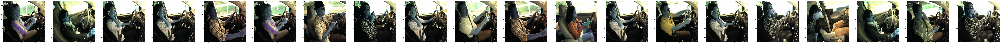

In [ ]:
test_image = []
i = 0
fig, ax = plt.subplots(1, 20, figsize = (img_rows,img_cols))

files = os.listdir('/content/drive/My Drive/kaggle/state-farm-detection/imgs/test20/')
nums = np.random.randint(low=1, high=len(files), size=20)
for i in range(20):
    print ('Image number:',i)
    img = cv2.imread('/content/drive/My Drive/kaggle/state-farm-detection/imgs/test20/'+files[nums[i]])
    #img = color.rgb2gray(img)
    #img = img[50:,120:-50]
    img = cv2.resize(img,(img_rows,img_cols))
    test_image.append(img)
    ax[i].imshow(img,cmap = 'gray')
    plt.show

In [ ]:
test = []

for img in test_image:
    test.append(img)
    

#model.load_weights('mobilenet_sgd_extra_layers.hdf5')

test = np.array(test).reshape(-1,img_rows,img_cols,color_type)
test.shape

(20, 224, 224, 3)

In [ ]:
%%time
model1=model.load_weights('/content/drive/My Drive/kaggle/state-farm-detection/MODELS/mobilenet_sgd_extra_layers1.hdf5')
model2=modelXception.load_weights('/content/drive/My Drive/kaggle/state-farm-detection/MODELS/xception_weights_aug_extralayer_alltrained_sgd2_V2.hdf5')
#model3=model_vgg16.load_weights('../input/models/weights_best_vgg16.hdf5')
#model_vgg19.load_weights('../input/vgg19model/weights_best_vgg19.hdf5')
model4=resnet50_pretrained.load_weights('/content/drive/My Drive/kaggle/state-farm-detection/MODELS/resnet_weights_aug_alltrained_sgd2_setval2.hdf5')

pred1=model.predict(test)
pred2=modelXception.predict(test)
#pred3=model_vgg19.predict(X_test)
pred4=resnet50_pretrained.predict(test)

#finalpred=(pred1*0.6+pred4*0.9+pred2*0.3+pred3*0.3)/4
finalpred=(pred1*0.7+pred4*0.9)/2
#finalpred=(pred1+pred2+pred3)/3


CPU times: user 895 ms, sys: 383 ms, total: 1.28 s
Wall time: 1.9 s


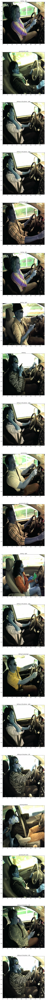

In [ ]:
#prediction=knn_predictions
prediction=finalpred

tags = { "C0": "safe driving",
"C1": "texting - right",
"C2": "talking on the phone - right",
"C3": "texting - left",
"C4": "talking on the phone - left",
"C5": "operating the radio",
"C6": "drinking",
"C7": "reaching behind",
"C8": "hair and makeup",
"C9": "talking to passenger" }

i = 0
fig, ax = plt.subplots(20, 1, figsize = (img_rows,img_cols))

for i in range(20):
    ax[i].imshow(test[i].squeeze())
    predicted_class = 'C'+str(np.where(prediction[i] == np.amax(prediction[i]))[0][0])
    ax[i].set_title(tags[predicted_class])
    plt.show

In [ ]:
%%time
test_image = []
test_id=[]
i = 0
#fig, ax = plt.subplots(1, 20, figsize = (50,50 ))

files = os.listdir('/content/drive/My Drive/kaggle/state-farm-detection/imgs/test/')
print(len(files))
j=len(files)/4
print(j)
a=int(j)+int(j)
b=a+int(j)
print(b)

for i in range(0,len(files)):
    print ('Image number:',str(i)+' File: '+files[i])
    
    img = cv2.imread('/content/drive/My Drive/kaggle/state-farm-detection/imgs/test/'+files[i])
    
    #img = color.rgb2gray(img)
    #img = img[50:,120:-50]
    img = cv2.resize(img,(img_rows,img_cols))
    test_image.append(img)
    test_id.append(files[i])
    #ax[i].imshow(img,cmap = 'gray')
    #plt.show

file = open('/content/drive/My Drive/kaggle/state-farm-detection/cacheTrain/test224.dat', 'wb')
pickle.dump(test_image, file)
file.close()
file = open('/content/drive/My Drive/kaggle/state-farm-detection/cacheTrain/test_id224.dat', 'wb')
pickle.dump(test_id, file)
file.close()

KeyboardInterrupt: ignored

In [ ]:
len(test_image)

2

In [ ]:
## Defining the input

from keras.layers import Input
vgg16_input = Input(shape = (224, 224, 3), name = 'Image_input')


## The VGG model

from keras.applications.vgg16 import VGG16, preprocess_input

#Get back the convolutional part of a VGG network trained on ImageNet
model_vgg16_conv = VGG16(weights='imagenet', include_top=False, input_tensor = vgg16_input)
#model_vgg16_conv.summary()
print('Model Loaded')

# **KNN**

In [ ]:
test_knn = []
file = open('/content/drive/My Drive/kaggle/state-farm-detection/cache/test32_indices.dat', 'rb')
test_knn=pickle.load(file)
file.close()
distancess,indices=test_knn

In [ ]:
%%time
test_images = []
file = open('/content/drive/My Drive/kaggle/state-farm-detection/cache/test32.dat', 'rb')
test_images=pickle.load(file)
file.close()
test,test_id=test_images

CPU times: user 75.3 ms, sys: 334 ms, total: 410 ms
Wall time: 507 ms


In [ ]:
ensem_df=pd.read_csv("/content/drive/My Drive/kaggle/state-farm-detection/cache/submission_ens-half1_2020-06-30-19-40+half2+half3+half4.csv",index_col=False)
ensem=ensem_df.values
ensem[0][:10]

array([8.66e-05, 0.000111703, 0.00023004400000000002, 0.000127489,
       0.000121401, 0.00016376700000000002, 0.76491165, 0.000240228,
       0.000619966, 5.379999999999999e-05], dtype=object)

In [ ]:
test_id[0]

'img_1085.jpg'

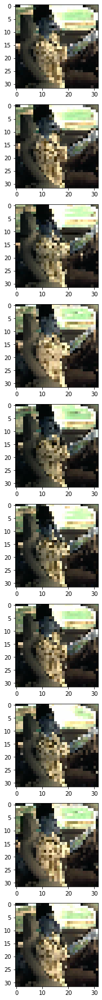

In [ ]:
fig, ax = plt.subplots(10, 1, figsize = (32,32))

img = 0

for i in indices[100]:  
    ax[img].imshow(test[i])
    plt.show
    img = img+1
    

In [ ]:
done=60000

In [ ]:
num=0
final=indices.shape[0]
if final-(done+10000)<=0:
  print("its time")
else:
  num=done
  done+=10000
  print(num,done)



60000 70000


In [ ]:
def create_submission(predictions, test_id, info):
    result1 = pd.DataFrame(predictions, columns=['c0', 'c1', 'c2', 'c3', 'c4', 'c5', 'c6', 'c7', 'c8', 'c9'])
    result1.loc[:, 'img'] = pd.Series(test_id, index=result1.index)
    now = datetime.datetime.now()
    if not os.path.isdir('/content/drive/My Drive/kaggle/state-farm-detection/subms'):
        os.mkdir('/content/drive/My Drive/kaggle/state-farm-detection/subms')
    suffix = info + '_' + str(now.strftime("%Y-%m-%d-%H-%M"))
    sub_file = os.path.join('/content/drive/My Drive/kaggle/state-farm-detection/subms', 'submission_' + suffix + '.csv')
    result1.to_csv(sub_file, index=False)

In [ ]:
%%time
knn_predictions = []
predictions = []



for i in range(num,done):#indices.shape[0]):
    mean_prediction = []
    print("Image Number: "+str(i))
    print('')
    for j in range(len(ensem[0])-1):
        for img in indices[i]:
            #print(img)
            id=test_id[img]
            for k in range(len(ensem)):
                if ensem[k][10]==id:
                    ensemble_prediction=ensem[k][:10]
                    #print(ensem[k][10],id)
                    #print(ensemble_prediction)
                    break
            #print(ensemble_prediction[j])
            predictions.append(ensemble_prediction[j])
        #print("herrer")
        trimmed_value = (sum(predictions) - max(predictions) - min(predictions))/(len(predictions) -2 )
        mean_value = np.mean(predictions)
        predictions = []
        
    
        mean_prediction.append(trimmed_value)
    
    
    mean_prediction = np.asarray(mean_prediction)/sum(mean_prediction)
    
    knn_predictions.append(mean_prediction)
    
knn_predictions = np.asarray(knn_predictions)           
        

        
print('The code is done')
knn_class = []

for i in range(len(knn_predictions)):
    knn_class.append(np.where(knn_predictions[i] == np.amax(knn_predictions[i]))[0][0])
info_string='knn-half9'
create_submission(knn_predictions, test_id[num:done], info_string)
print("csv created")
file = open('/content/drive/My Drive/kaggle/state-farm-detection/cache/test32_knn_pred_9.dat', 'wb')
pickle.dump(knn_predictions, file)
file.close()
print("File Dumped!")

In [ ]:
def create_submission(predictions, test_id, info):
    result1 = pd.DataFrame(predictions, columns=['c0', 'c1', 'c2', 'c3', 'c4', 'c5', 'c6', 'c7', 'c8', 'c9'])
    result1.loc[:, 'img'] = pd.Series(test_id, index=result1.index)
    now = datetime.datetime.now()
    if not os.path.isdir('/content/drive/My Drive/kaggle/state-farm-detection/subms'):
        os.mkdir('/content/drive/My Drive/kaggle/state-farm-detection/subms')
    suffix = info + '_' + str(now.strftime("%Y-%m-%d-%H-%M"))
    sub_file = os.path.join('/content/drive/My Drive/kaggle/state-farm-detection/subms', 'submission_' + suffix + '.csv')
    result1.to_csv(sub_file, index=False)

In [ ]:
info_string='knn-half2'
create_submission(knn_predictions, test_id[num:done], info_string)
print("csv created")
file = open('/content/drive/My Drive/kaggle/state-farm-detection/cache/test32_knn_pred_2.dat', 'wb')
pickle.dump(knn_predictions, file)
file.close()
print("File Dumped!")

csv created
File Dumped!


In [ ]:
info_string='knn-half1'
create_submission(prediction, test_id1, info_string)

In [ ]:
file = open('/content/drive/My Drive/kaggle/state-farm-detection/cache/test32_knn_pred.dat', 'wb')
pickle.dump(knn_predictions, file)
file.close()

In [ ]:
img_rows=img_cols=32

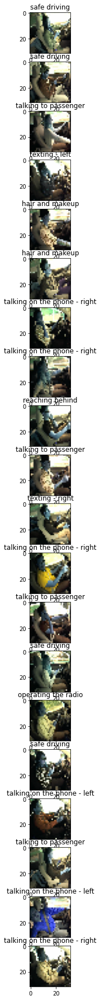

In [ ]:
#prediction=knn_predictions
prediction=knn_predictions

tags = { "C0": "safe driving",
"C1": "texting - right",
"C2": "talking on the phone - right",
"C3": "texting - left",
"C4": "talking on the phone - left",
"C5": "operating the radio",
"C6": "drinking",
"C7": "reaching behind",
"C8": "hair and makeup",
"C9": "talking to passenger" }

i = 0
j=num+20
fig, ax = plt.subplots(20, 1, figsize = (img_rows,img_cols))

for i in range(20):
    ax[i].imshow(test[j].squeeze())
    predicted_class = 'C'+str(np.where(prediction[j] == np.amax(prediction[j]))[0][0])
    ax[i].set_title(tags[predicted_class])
    j+=1
    plt.show

In [ ]:
file = open('/content/drive/My Drive/kaggle/state-farm-detection/cache/test100_knninput.dat', 'rb')
knn_input=pickle.load(file)
file.close()

In [ ]:
import numpy as np
from sklearn.neighbors import KDTree
rng = np.random.RandomState(0)
X = rng.random_sample((10, 3))  # 10 points in 3 dimensions
tree = KDTree(X, leaf_size=2)              # doctest: +SKIP
dist, ind = tree.query(X[:1], k=3)                # doctest: +SKIP
print(ind)  # indices of 3 closest neighbors

print(dist)

[[0 3 1]]
[[0.         0.19662693 0.29473397]]


In [ ]:
%%time
from sklearn.neighbors import KDTree
tree= KDTree(knn_input)
dist,ind=tree.query(knn_input[:1], k=10)   

CPU times: user 2min 1s, sys: 1.4 s, total: 2min 3s
Wall time: 2min 2s


In [ ]:
ind

array([[    0, 76405, 77195, 54618, 10535, 55935, 65588, 49517, 48222,
        49882]])

In [ ]:
file = open('/content/drive/My Drive/kaggle/state-farm-detection/cache/test100.dat', 'rb')
test=pickle.load(file)
file.close()

In [ ]:
len(test)

79726

In [ ]:
%%time
dist,ind=tree.query(knn_input[0:1], k=10) 

CPU times: user 663 ms, sys: 859 µs, total: 664 ms
Wall time: 664 ms


In [ ]:
ind

array([[    0, 76405, 77195, 54618, 10535, 55935, 65588, 49517, 48222,
        49882]])

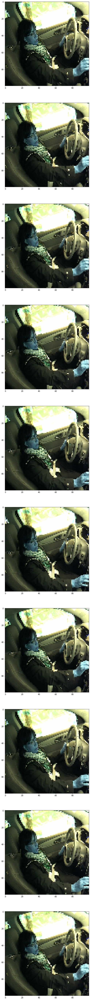

In [ ]:
fig, ax = plt.subplots(10, 1 ,figsize = (100,100))

img = 0

for i in ind[0]:  
    ax[img].imshow(test[i])
    plt.show
    img = img+1
    

In [ ]:
def create_submission(predictions, test_id, info):
    result1 = pd.DataFrame(predictions, columns=['c0', 'c1', 'c2', 'c3', 'c4', 'c5', 'c6', 'c7', 'c8', 'c9'])
    result1.loc[:, 'img'] = pd.Series(test_id, index=result1.index)
    now = datetime.datetime.now()
    if not os.path.isdir('/content/drive/My Drive/kaggle/state-farm-detection/subms'):
        os.mkdir('/content/drive/My Drive/kaggle/state-farm-detection/subms')
    suffix = info + '_' + str(now.strftime("%Y-%m-%d-%H-%M"))
    sub_file = os.path.join('/content/drive/My Drive/kaggle/state-farm-detection/subms', 'submission_' + suffix + '.csv')
    result1.to_csv(sub_file, index=False)

In [ ]:
num=0
done=79726
ensem_df=pd.read_csv("/content/drive/My Drive/kaggle/state-farm-detection/cache/submission_ens-half1_2020-06-30-19-40+half2+half3+half4.csv",index_col=False)
sorted_ensem_df=ensem_df.sort_values(by=['img'])
sorted_ensem_df


,c0,c1,c2,c3,c4,c5,c6,c7,c8,c9,img
55147,1.860000e-05,2.807450e-04,0.001189,1.582992e-03,1.220000e-05,7.634502e-01,5.480000e-06,3.280000e-05,0.000085,0.000010,img_1.jpg
29507,3.770000e-05,5.970000e-06,0.000006,8.260000e-06,1.410000e-05,7.665591e-01,8.430000e-06,3.080000e-06,0.000022,0.000002,img_10.jpg
12060,7.421864e-01,2.182240e-04,0.000081,2.850000e-06,1.650000e-05,2.173900e-04,9.124180e-04,7.180000e-05,0.015860,0.007100,img_100.jpg
74498,1.290000e-07,1.430000e-08,0.000001,1.860000e-08,6.710000e-07,4.480000e-07,5.500000e-07,1.440000e-07,0.766643,0.000020,img_1000.jpg
61757,6.620000e-05,2.116270e-04,0.000092,7.610518e-01,4.332845e-03,1.415560e-04,3.456320e-04,3.230000e-05,0.000100,0.000293,img_100000.jpg
...,...,...,...,...,...,...,...,...,...,...,...
18663,4.280000e-06,7.537050e-01,0.010165,2.400000e-07,1.170000e-07,2.460000e-06,2.170000e-06,2.767804e-03,0.000011,0.000008,img_99994.jpg
61266,1.271740e-04,1.482851e-03,0.000032,7.633827e-01,4.050620e-04,1.472700e-04,8.772510e-04,3.270000e-05,0.000052,0.000128,img_99995.jpg
12815,2.180000e-06,2.852580e-04,0.000025,1.229626e-03,7.637674e-01,3.550000e-06,2.480000e-05,3.090000e-05,0.001296,0.000001,img_99996.jpg
49066,4.978500e-04,3.348670e-04,0.001180,5.979270e-04,2.037490e-04,5.600850e-04,7.618831e-01,4.925410e-04,0.000709,0.000207,img_99998.jpg


In [ ]:
ensem=sorted_ensem_df.to_numpy()
ensem[0][:10]

array([1.86e-05, 0.000280745, 0.001188675, 0.001582992, 1.22e-05,
       0.76345015, 5.48e-06, 3.28e-05, 8.540000000000002e-05, 9.69e-06],
      dtype=object)

In [ ]:
a=int(79726/4)
b=a+a
c=b+a
d=79726
print(a,b,c,d)
num=c
done=d

19931 39862 59793 79726


In [ ]:
%%time
knn_predictions = []
predictions = []



for i in range(num,done):#indices.shape[0]):
    mean_prediction = []
   
    print("Image Number: "+str(i))
    print('')
    dist,ind=tree.query(knn_input[i:i+1], k=10) 
    for j in range(len(ensem[0])-1):
        for img in ind[0]:
            #print(img)
            
            ensemble_prediction=ensem[img][:10]
            #print(ensem[k][10],id)
            #print(ensemble_prediction)
                
            #print(ensemble_prediction[j])
            predictions.append(ensemble_prediction[j])
        #print("herrer")
        #trimmed_value = (sum(predictions) - max(predictions) - min(predictions))/(len(predictions) -2 )
        
        mean_value = np.mean(predictions)
        predictions = []
        
    
        mean_prediction.append(mean_value)
        
    
    
    mean_prediction = np.asarray(mean_prediction)/sum(mean_prediction)
    
    knn_predictions.append(mean_prediction)
    
knn_predictions = np.asarray(knn_predictions)           
 

        
print('The code is done')
knn_class = []
ensembles=ensem[num:done]
for i in range(len(knn_predictions)):
    knn_class.append(np.where(knn_predictions[i] == np.amax(knn_predictions[i]))[0][0])
info_string='kd-100_10_4'
create_submission(knn_predictions, ensembles[:,10], info_string)
print("csv created")


Streaming output truncated to the last 5000 lines.

Image Number: 77229

Image Number: 77230

Image Number: 77231

Image Number: 77232

Image Number: 77233

Image Number: 77234

Image Number: 77235

Image Number: 77236

Image Number: 77237

Image Number: 77238

Image Number: 77239

Image Number: 77240

Image Number: 77241

Image Number: 77242

Image Number: 77243

Image Number: 77244

Image Number: 77245

Image Number: 77246

Image Number: 77247

Image Number: 77248

Image Number: 77249

Image Number: 77250

Image Number: 77251

Image Number: 77252

Image Number: 77253

Image Number: 77254

Image Number: 77255

Image Number: 77256

Image Number: 77257

Image Number: 77258

Image Number: 77259

Image Number: 77260

Image Number: 77261

Image Number: 77262

Image Number: 77263

Image Number: 77264

Image Number: 77265

Image Number: 77266

Image Number: 77267

Image Number: 77268

Image Number: 77269

Image Number: 77270

Image Number: 77271

Image Number: 77272

Image Number: 77273

Ima

In [ ]:
def create_submission(predictions, test_id, info):
    result1 = pd.DataFrame(predictions, columns=['c0', 'c1', 'c2', 'c3', 'c4', 'c5', 'c6', 'c7', 'c8', 'c9'])
    result1.loc[:, 'img'] = pd.Series(test_id, index=result1.index)
    now = datetime.datetime.now()
    if not os.path.isdir('/content/drive/My Drive/kaggle/state-farm-detection/subms/final'):
        os.mkdir('/content/drive/My Drive/kaggle/state-farm-detection/subms/final')
    suffix = info + '_' + str(now.strftime("%Y-%m-%d-%H-%M"))
    sub_file = os.path.join('/content/drive/My Drive/kaggle/state-farm-detection/subms/final', 'submission_' + suffix + '.csv')
    result1.to_csv(sub_file, index=False)
ensem_df=pd.read_csv("/content/drive/My Drive/kaggle/state-farm-detection/subms/preds/submission_predEnsembleTrimmed3_2020-07-15-16-39.csv",index_col=False)
ensem=ensem_df.to_numpy()
ensem[0][1:]


array([0.000478384, 1.36e-05, 8.98e-05, 0.0007475660000000001,
       1.7100000000000002e-05, 0.9888550209999999, 9.15e-06,
       5.2000000000000004e-05, 0.00016711299999999998, 0.00957029],
      dtype=object)

In [ ]:
%%time
knn_predictions = []
knn_predictions_trimmed=[]
predictions = []



for i in range(num,done):#indices.shape[0]):
    mean_prediction = []
    mean_prediction_trimmed=[]
   
    print("Image Number: "+str(i))
    print('')
    dist,ind=tree.query(knn_input[i:i+1], k=10) 
    for j in range(len(ensem[0])-1):
        for img in ind[0]:
            #print(img)
            
            ensemble_prediction=ensem[img][1:]
            #print(ensem[k][10],id)
            #print(ensemble_prediction)
                
            #print(ensemble_prediction[j])
            predictions.append(ensemble_prediction[j])
        #print("herrer")
        trimmed_value = (sum(predictions) - max(predictions) - min(predictions))/(len(predictions) -2 )
        
        mean_value = np.mean(predictions)
        predictions = []
        
    
        mean_prediction.append(mean_value)
        mean_prediction_trimmed.append(trimmed_value)
    
    
    mean_prediction = np.asarray(mean_prediction)/sum(mean_prediction)
    mean_prediction_trimmed = np.asarray(mean_prediction_trimmed)/sum(mean_prediction_trimmed)

    knn_predictions.append(mean_prediction)
    knn_predictions_trimmed.append(mean_prediction_trimmed)

knn_predictions = np.asarray(knn_predictions)           
knn_predictions_trimmed = np.asarray(knn_predictions_trimmed) 

        
print('The code is done')
knn_class = []
ensembles=ensem[num:done]
for i in range(len(knn_predictions)):
    knn_class.append(np.where(knn_predictions[i] == np.amax(knn_predictions[i]))[0][0])
info_string='kd-100_trimmed3_4'
create_submission(knn_predictions_trimmed, ensembles[:,1], info_string)
print("csv created")

info_string='kd-100_NOTtrimmed3_4'
create_submission(knn_predictions, ensembles[:,1], info_string)
print("csv created")



Streaming output truncated to the last 5000 lines.
Image Number: 77229

Image Number: 77230

Image Number: 77231

Image Number: 77232

Image Number: 77233

Image Number: 77234

Image Number: 77235

Image Number: 77236

Image Number: 77237

Image Number: 77238

Image Number: 77239

Image Number: 77240

Image Number: 77241

Image Number: 77242

Image Number: 77243

Image Number: 77244

Image Number: 77245

Image Number: 77246

Image Number: 77247

Image Number: 77248

Image Number: 77249

Image Number: 77250

Image Number: 77251

Image Number: 77252

Image Number: 77253

Image Number: 77254

Image Number: 77255

Image Number: 77256

Image Number: 77257

Image Number: 77258

Image Number: 77259

Image Number: 77260

Image Number: 77261

Image Number: 77262

Image Number: 77263

Image Number: 77264

Image Number: 77265

Image Number: 77266

Image Number: 77267

Image Number: 77268

Image Number: 77269

Image Number: 77270

Image Number: 77271

Image Number: 77272

Image Number: 77273

Imag

# **Final predictions result**

In [ ]:
ensem_df=pd.read_csv("/content/drive/My Drive/kaggle/state-farm-detection/subms/final/submission_kd-100_trimmed3_1_2020-07-15-22-29+2+3+4.csv",index_col=False)
ensem=ensem_df.to_numpy()
ensem[0][1:]

array([0.00026073299999999997, 0.000136375, 0.000256889,
       0.0007226489999999999, 4.6899999999999995e-05, 0.963739017,
       0.00018559799999999998, 0.000140768, 0.000336818, 0.034174228],
      dtype=object)

<function matplotlib.pyplot.show>

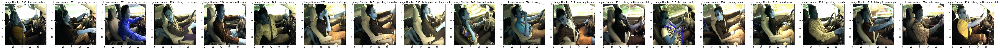

In [ ]:
pred=ensem[:,1:]   #ensem
tags = { "C0": "safe driving",
"C1": "texting - right",
"C2": "talking on the phone - right",
"C3": "texting - left",
"C4": "talking on the phone - left",
"C5": "operating the radio",
"C6": "drinking",
"C7": "reaching behind",
"C8": "hair and makeup",
"C9": "talking to passenger" }
fig, ax = plt.subplots(1, 20 ,figsize = (100,100))

img = 0

for i in range(700,720):  
    ax[img].imshow(test[i])
    ax[img].set_title("Image Number: "+str(i)+" : "+tags['C'+str(np.argmax(pred[i]))])
    
    
    
    img = img+1
plt.show